In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

# Train/Test Model

In [10]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [11]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [104]:
test

,DateTime,cloud_cover
0,2021-12-10 15:24:00,0.538
1,2021-12-10 15:25:00,0.588
2,2021-12-10 15:26:00,0.566
3,2021-12-10 15:27:00,0.562
4,2021-12-10 15:28:00,0.612
...,...,...
3008,2021-12-16 13:58:00,0.168
3009,2021-12-16 13:59:00,0.169
3010,2021-12-16 14:00:00,0.147
3011,2021-12-16 14:01:00,0.145


In [12]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [13]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,30)

X_train Shape : (12018, 30, 1)
y_train Shape : (12018, 1)
X_test Shape :  (3013, 30, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [14]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [15]:
test1 = test.copy()

In [16]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 18ms/step - loss: 0.0176 - val_loss: 0.0050
Epoch 2/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0034 - val_loss: 0.0039
Epoch 3/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0025 - val_loss: 0.0035
Epoch 4/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 5/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 6/10
376/376 [==============================] - 5s 15ms/step - loss: 0.0014 - val_loss: 0.0032
Epoch 7/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0010 - val_l

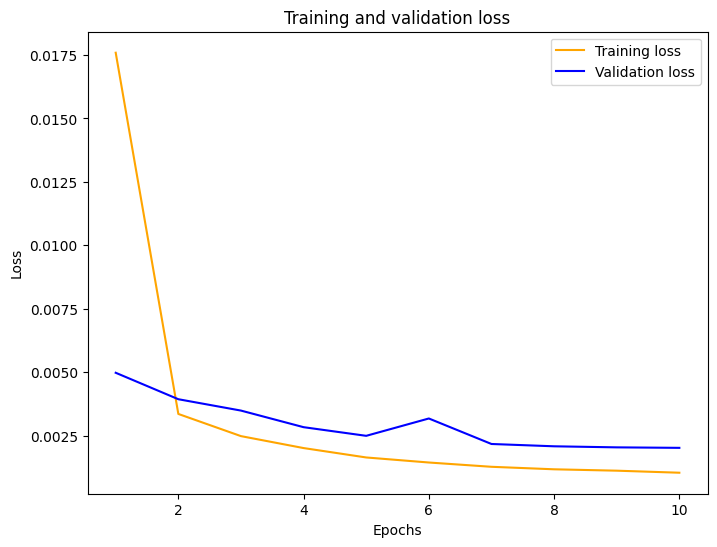

In [17]:
plot_curve(hist_adam)

In [18]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.554232
1,2021-12-10 15:25:00,0.588,0.539015
2,2021-12-10 15:26:00,0.566,0.580492
3,2021-12-10 15:27:00,0.562,0.575258
4,2021-12-10 15:28:00,0.612,0.562736
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538
3009,2021-12-16 13:59:00,0.169,0.167909
3010,2021-12-16 14:00:00,0.147,0.168709
3011,2021-12-16 14:01:00,0.145,0.151788


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [20]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.002004158375619647

In [21]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'The frist layer', 'The frist layer add Drop out', 'The second layer', 'The second layer add Drop out', 
                                 'The third layer', 'The output layer', 'epochs','mse error'])

data = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_adam}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\216271084.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [22]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 16ms/step - loss: 0.0058 - val_loss: 0.0029
Epoch 2/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 5/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_l

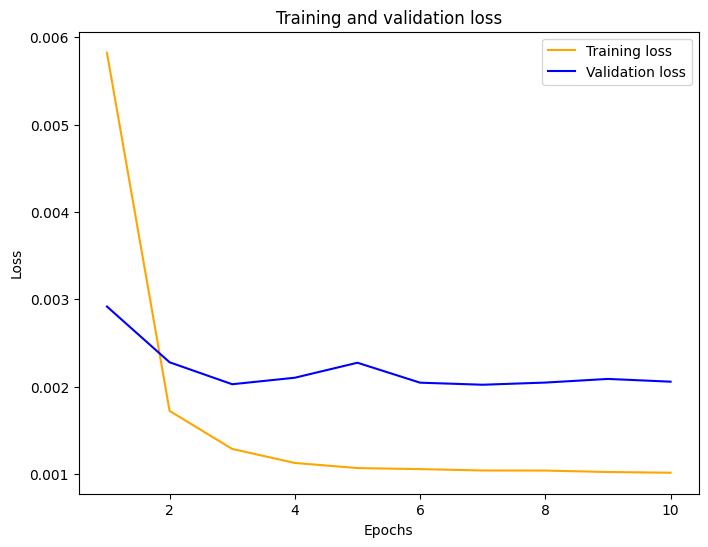

In [23]:
plot_curve(hist_50_rms)

In [24]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.554232,0.551051
1,2021-12-10 15:25:00,0.588,0.539015,0.535501
2,2021-12-10 15:26:00,0.566,0.580492,0.589941
3,2021-12-10 15:27:00,0.562,0.575258,0.567646
4,2021-12-10 15:28:00,0.612,0.562736,0.562657
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538,0.169164
3009,2021-12-16 13:59:00,0.169,0.167909,0.169003
3010,2021-12-16 14:00:00,0.147,0.168709,0.169985
3011,2021-12-16 14:01:00,0.145,0.151788,0.149133


In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [26]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002047


In [27]:
data1 = [{'Lags':30 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_rms}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\4289576178.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [28]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
188/188 [==============================] - 9s 23ms/step - loss: 0.0166 - val_loss: 0.0045
Epoch 2/10
188/188 [==============================] - 4s 21ms/step - loss: 0.0032 - val_loss: 0.0037
Epoch 3/10
188/188 [==============================] - 3s 18ms/step - loss: 0.0025 - val_loss: 0.0033
Epoch 4/10
188/188 [==============================] - 3s 19ms/step - loss: 0.0020 - val_loss: 0.0030
Epoch 5/10
188/188 [==============================] - 4s 19ms/step - loss: 0.0017 - val_loss: 0.0027
Epoch 6/10
188/188 [==============================] - 4s 19ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 7/10
188/188 [==============================] - 4s 22ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 8/10
188/188 [==============================] - 4s 19ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 9/10
188/188 [==============================] - 4s 19ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 10/10
188/188 [==============================] - 4s 22ms/step - loss: 0.0011 - val_lo

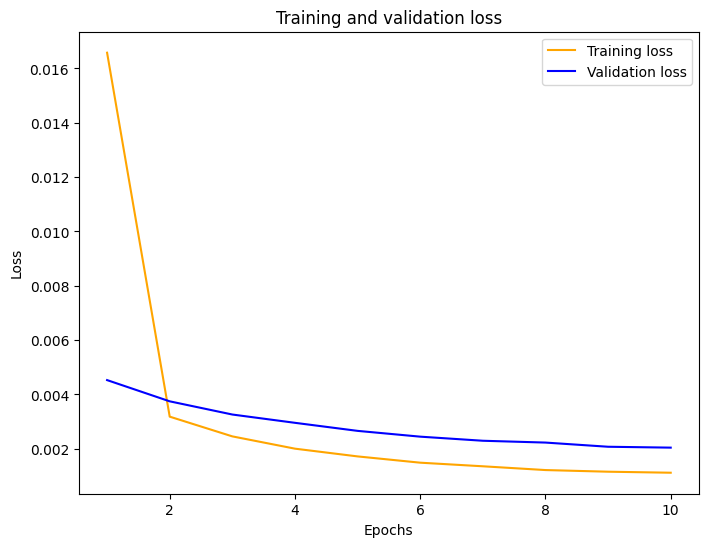

In [29]:
plot_curve(hist_batch_size64)

In [30]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.554232,0.551051,0.553268
1,2021-12-10 15:25:00,0.588,0.539015,0.535501,0.534311
2,2021-12-10 15:26:00,0.566,0.580492,0.589941,0.569756
3,2021-12-10 15:27:00,0.562,0.575258,0.567646,0.570811
4,2021-12-10 15:28:00,0.612,0.562736,0.562657,0.561949
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538,0.169164,0.166554
3009,2021-12-16 13:59:00,0.169,0.167909,0.169003,0.166150
3010,2021-12-16 14:00:00,0.147,0.168709,0.169985,0.166540
3011,2021-12-16 14:01:00,0.145,0.151788,0.149133,0.153746


In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [32]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002032


In [33]:
data2 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_batch_size64}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\780536126.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032


---

### learning rate 0.1

In [34]:
test2 = test.copy()

#### Add frist layer: units = 50

In [35]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 18ms/step - loss: 0.2362 - val_loss: 0.0559
Epoch 2/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0304 - val_loss: 0.0134
Epoch 3/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0221 - val_loss: 0.0291
Epoch 4/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0183 - val_loss: 0.0112
Epoch 5/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0136 - val_loss: 0.0059
Epoch 6/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0107 - val_loss: 0.0122
Epoch 7/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0090 - val_loss: 0.0053
Epoch 8/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0054 - val_loss: 0.0022
Epoch 9/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0055 - val_loss: 0.0032
Epoch 10/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0061 - val_l

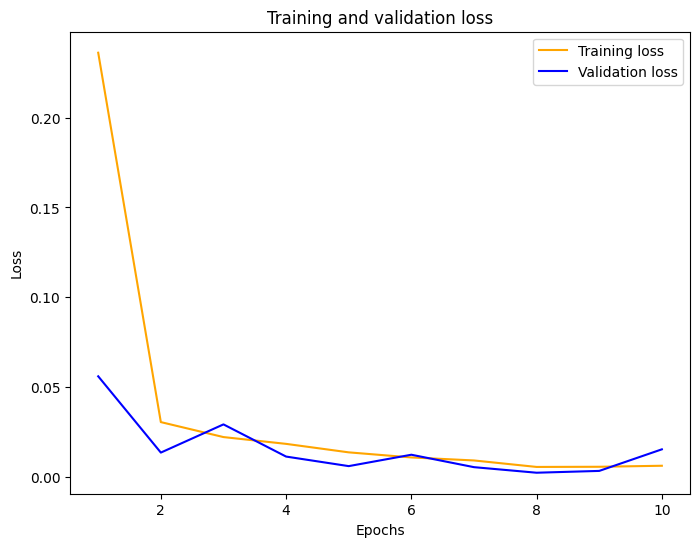

In [36]:
plot_curve(hist_01)

In [37]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 2s 8ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.666868
1,2021-12-10 15:25:00,0.588,0.648717
2,2021-12-10 15:26:00,0.566,0.686406
3,2021-12-10 15:27:00,0.562,0.674108
4,2021-12-10 15:28:00,0.612,0.669266
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.288125
3009,2021-12-16 13:59:00,0.169,0.287857
3010,2021-12-16 14:00:00,0.147,0.288471
3011,2021-12-16 14:01:00,0.145,0.273182


In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [39]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.015158


In [40]:
data3 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_01}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\708412685.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [41]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 18ms/step - loss: 0.0336 - val_loss: 0.0030
Epoch 2/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0018 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0016 - val_loss: 0.0024
Epoch 4/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0014 - val_loss: 0.0028
Epoch 5/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 9/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0012 - val_l

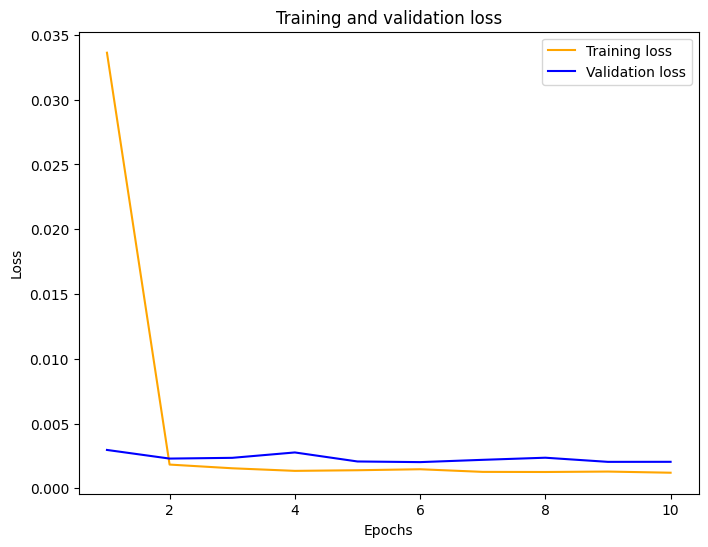

In [42]:
plot_curve(hist_005)

In [43]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 7ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.666868,0.556901
1,2021-12-10 15:25:00,0.588,0.648717,0.541512
2,2021-12-10 15:26:00,0.566,0.686406,0.594929
3,2021-12-10 15:27:00,0.562,0.674108,0.574279
4,2021-12-10 15:28:00,0.612,0.669266,0.567555
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.288125,0.170514
3009,2021-12-16 13:59:00,0.169,0.287857,0.170504
3010,2021-12-16 14:00:00,0.147,0.288471,0.171610
3011,2021-12-16 14:01:00,0.145,0.273182,0.149269


In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [45]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002040


In [46]:
data4 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_005}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\83372142.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [47]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 17ms/step - loss: 0.0036 - val_loss: 0.0024
Epoch 2/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 3/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0010 - val_l

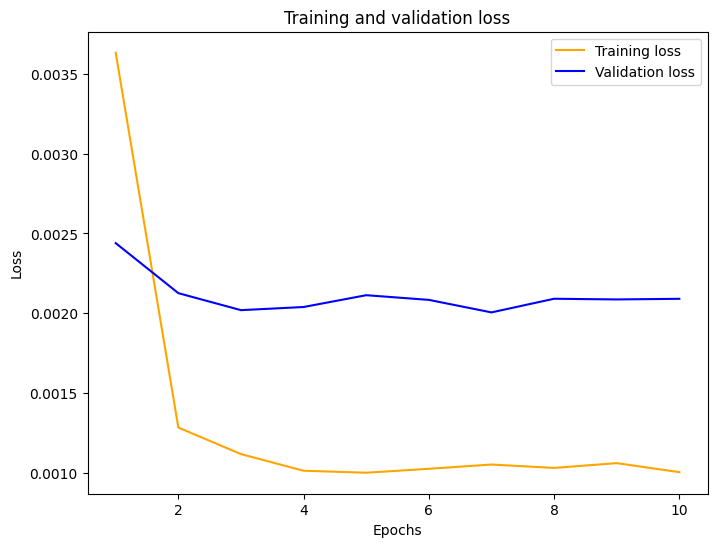

In [48]:
plot_curve(hist_001)

In [49]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 2s 9ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.666868,0.556901,0.544954
1,2021-12-10 15:25:00,0.588,0.648717,0.541512,0.527732
2,2021-12-10 15:26:00,0.566,0.686406,0.594929,0.583506
3,2021-12-10 15:27:00,0.562,0.674108,0.574279,0.554193
4,2021-12-10 15:28:00,0.612,0.669266,0.567555,0.553738
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.288125,0.170514,0.171945
3009,2021-12-16 13:59:00,0.169,0.287857,0.170504,0.171959
3010,2021-12-16 14:00:00,0.147,0.288471,0.171610,0.173008
3011,2021-12-16 14:01:00,0.145,0.273182,0.149269,0.150694


In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [51]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002080


In [52]:
data = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_001}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\893641836.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [53]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 18ms/step - loss: 0.0048 - val_loss: 0.0027
Epoch 2/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 3/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 5/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0024
Epoch 7/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 5s 15ms/step - loss: 9.8136e-04 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - v

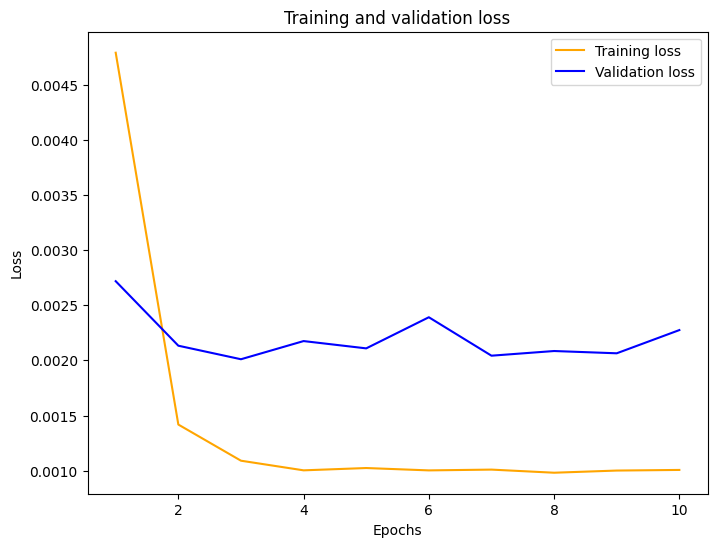

In [54]:
plot_curve(hist_0005)

In [55]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.666868,0.556901,0.544954,0.546935
1,2021-12-10 15:25:00,0.588,0.648717,0.541512,0.527732,0.525287
2,2021-12-10 15:26:00,0.566,0.686406,0.594929,0.583506,0.578108
3,2021-12-10 15:27:00,0.562,0.674108,0.574279,0.554193,0.541828
4,2021-12-10 15:28:00,0.612,0.669266,0.567555,0.553738,0.546692
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.288125,0.170514,0.171945,0.152506
3009,2021-12-16 13:59:00,0.169,0.287857,0.170504,0.171959,0.152603
3010,2021-12-16 14:00:00,0.147,0.288471,0.171610,0.173008,0.153446
3011,2021-12-16 14:01:00,0.145,0.273182,0.149269,0.150694,0.132731


In [56]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [57]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_001,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0020802269572163003


,Model,MSE error
0,model,0.002080
1,model_1,0.002263


In [58]:
data5 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_0005}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\3221670312.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [59]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 15ms/step - loss: 0.0150 - val_loss: 0.0041
Epoch 2/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0026 - val_loss: 0.0033
Epoch 3/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0020 - val_loss: 0.0029
Epoch 4/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 5/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 7/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 5s 14ms/step - loss: 9.9947e-04 - v

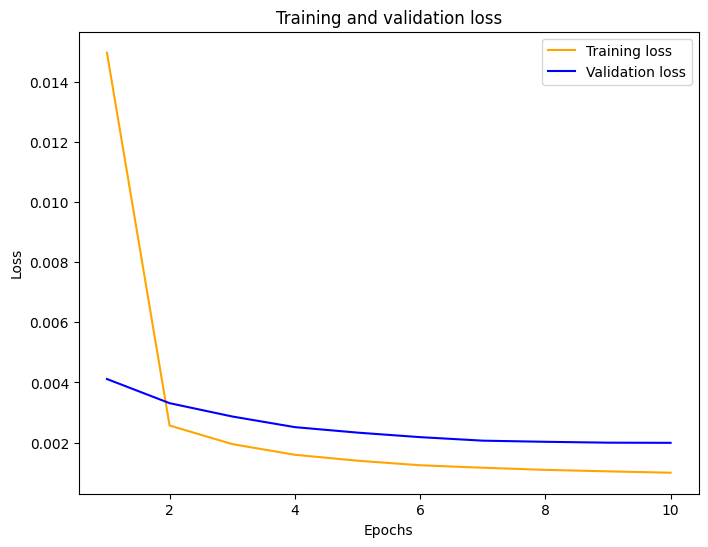

In [60]:
plot_curve(hist_0001)

In [61]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.666868,0.556901,0.544954,0.546935,0.544954
1,2021-12-10 15:25:00,0.588,0.648717,0.541512,0.527732,0.525287,0.527732
2,2021-12-10 15:26:00,0.566,0.686406,0.594929,0.583506,0.578108,0.583506
3,2021-12-10 15:27:00,0.562,0.674108,0.574279,0.554193,0.541828,0.554193
4,2021-12-10 15:28:00,0.612,0.669266,0.567555,0.553738,0.546692,0.553738
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.288125,0.170514,0.171945,0.152506,0.171945
3009,2021-12-16 13:59:00,0.169,0.287857,0.170504,0.171959,0.152603,0.171959
3010,2021-12-16 14:00:00,0.147,0.288471,0.171610,0.173008,0.153446,0.173008
3011,2021-12-16 14:01:00,0.145,0.273182,0.149269,0.150694,0.132731,0.150694


In [62]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [64]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_0001)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002080


In [65]:
data6 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_0001}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\2637510187.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263
7,30,Adam,32,0.001,50,,,,,1,10,0.002080


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [66]:
test3 = test.copy()

In [67]:
test3['LSTM_50'] = predict_adam

In [68]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
model_1.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 21ms/step - loss: 0.0090 - val_loss: 0.0039
Epoch 2/10
376/376 [==============================] - 7s 19ms/step - loss: 0.0024 - val_loss: 0.0032
Epoch 3/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0018 - val_loss: 0.0029
Epoch 4/10
376/376 [==============================] - 7s 19ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 5/10
376/376 [==============================] - 7s 19ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 6/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 10s 27ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 7s 20ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 7s 20ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 7s 19ms/step - loss: 9.9136e-04 - 

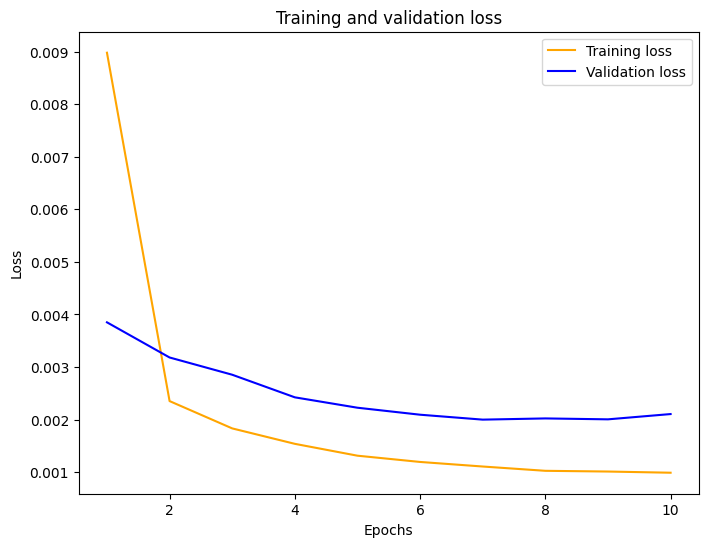

In [69]:
plot_curve(hist_1)

In [70]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.554232,0.562213
1,2021-12-10 15:25:00,0.588,0.539015,0.547541
2,2021-12-10 15:26:00,0.566,0.580492,0.595627
3,2021-12-10 15:27:00,0.562,0.575258,0.574058
4,2021-12-10 15:28:00,0.612,0.562736,0.567671
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538,0.182246
3009,2021-12-16 13:59:00,0.169,0.167909,0.182031
3010,2021-12-16 14:00:00,0.147,0.168709,0.182972
3011,2021-12-16 14:01:00,0.145,0.151788,0.163182


In [71]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [72]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_100)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002096


In [73]:
data7 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_100}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\1555797090.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263
7,30,Adam,32,0.001,50,,,,,1,10,0.002080
8,30,Adam,32,,100,,,,,1,10,0.002096


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [74]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
model_2.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 15ms/step - loss: 0.0090 - val_loss: 0.0037
Epoch 2/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0035 - val_loss: 0.0032
Epoch 3/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0029 - val_loss: 0.0029
Epoch 4/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0026 - val_loss: 0.0027
Epoch 5/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 6/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0021 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0020 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0019 - val_loss: 0.0022
Epoch 9/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0018 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0017 - val_l

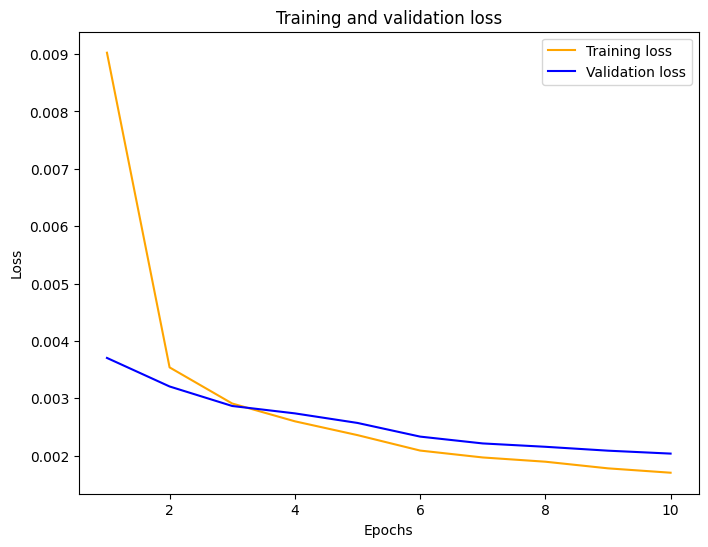

In [75]:
plot_curve(hist_2)

In [76]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.554232,0.562213,0.555405
1,2021-12-10 15:25:00,0.588,0.539015,0.547541,0.535192
2,2021-12-10 15:26:00,0.566,0.580492,0.595627,0.568748
3,2021-12-10 15:27:00,0.562,0.575258,0.574058,0.568078
4,2021-12-10 15:28:00,0.612,0.562736,0.567671,0.561597
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538,0.182246,0.169542
3009,2021-12-16 13:59:00,0.169,0.167909,0.182031,0.169198
3010,2021-12-16 14:00:00,0.147,0.168709,0.182972,0.169648
3011,2021-12-16 14:01:00,0.145,0.151788,0.163182,0.156818


In [77]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [78]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_50_drop_out)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002028


In [79]:
data8 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_50_drop_out}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\3122225077.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263
7,30,Adam,32,0.001,50,,,,,1,10,0.002080
8,30,Adam,32,,100,,,,,1,10,0.002096
9,30,Adam,32,,50,0.1,,,,1,10,0.002028


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [80]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
model_3.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 17s 27ms/step - loss: 0.0098 - val_loss: 0.0042
Epoch 2/10
376/376 [==============================] - 9s 24ms/step - loss: 0.0026 - val_loss: 0.0033
Epoch 3/10
376/376 [==============================] - 10s 25ms/step - loss: 0.0020 - val_loss: 0.0028
Epoch 4/10
376/376 [==============================] - 10s 25ms/step - loss: 0.0015 - val_loss: 0.0024
Epoch 5/10
376/376 [==============================] - 10s 26ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 6/10
376/376 [==============================] - 10s 26ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 10s 26ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 8/10
376/376 [==============================] - 10s 26ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 10s 26ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 12s 33ms/step - loss: 0.0010

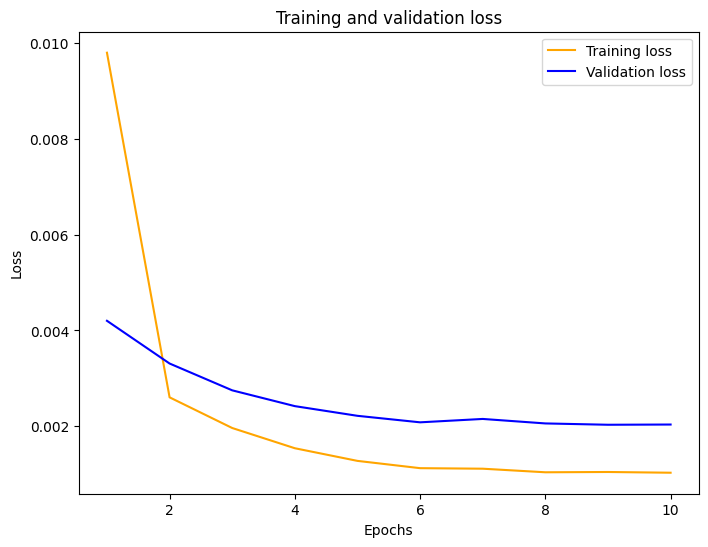

In [81]:
plot_curve(hist_3)

In [82]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 3s 11ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.554232,0.562213,0.555405,0.550366
1,2021-12-10 15:25:00,0.588,0.539015,0.547541,0.535192,0.533094
2,2021-12-10 15:26:00,0.566,0.580492,0.595627,0.568748,0.587784
3,2021-12-10 15:27:00,0.562,0.575258,0.574058,0.568078,0.562081
4,2021-12-10 15:28:00,0.612,0.562736,0.567671,0.561597,0.559368
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538,0.182246,0.169542,0.170173
3009,2021-12-16 13:59:00,0.169,0.167909,0.182031,0.169198,0.169923
3010,2021-12-16 14:00:00,0.147,0.168709,0.182972,0.169648,0.170793
3011,2021-12-16 14:01:00,0.145,0.151788,0.163182,0.156818,0.151979


In [83]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [84]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_second_layer)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002028


In [85]:
data10 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':50, 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_second_layer}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\738841405.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263
7,30,Adam,32,0.001,50,,,,,1,10,0.002080
8,30,Adam,32,,100,,,,,1,10,0.002096
9,30,Adam,32,,50,0.1,,,,1,10,0.002028


---

### Add frist layer: units = 50 and change epochs from 10 to 20

In [86]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
model_5.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
376/376 [==============================] - 10s 15ms/step - loss: 0.0086 - val_loss: 0.0036
Epoch 2/20
376/376 [==============================] - 5s 14ms/step - loss: 0.0022 - val_loss: 0.0030
Epoch 3/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0018 - val_loss: 0.0027
Epoch 4/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 5/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0014 - val_loss: 0.0025
Epoch 6/20
376/376 [==============================] - 5s 13ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 7/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/20
376/376 [==============================] - 5s 14ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/20
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_l

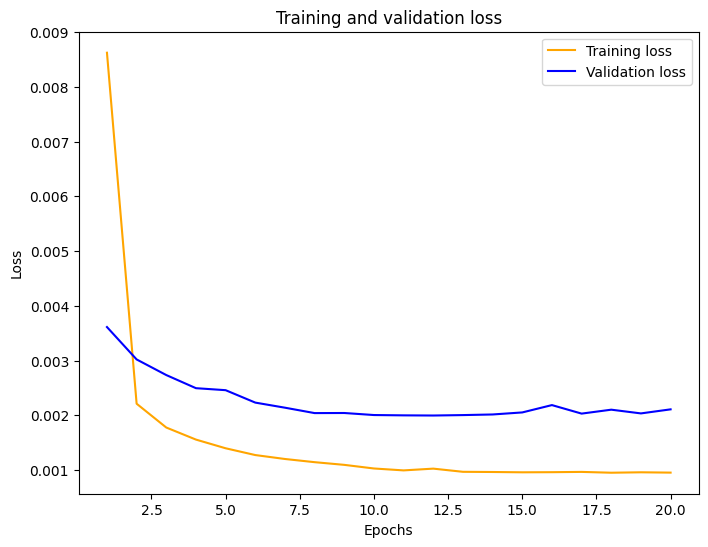

In [87]:
plot_curve(hist_5)

In [88]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.554232,0.562213,0.555405,0.550366,0.543298
1,2021-12-10 15:25:00,0.588,0.539015,0.547541,0.535192,0.533094,0.525759
2,2021-12-10 15:26:00,0.566,0.580492,0.595627,0.568748,0.587784,0.579780
3,2021-12-10 15:27:00,0.562,0.575258,0.574058,0.568078,0.562081,0.552919
4,2021-12-10 15:28:00,0.612,0.562736,0.567671,0.561597,0.559368,0.551206
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.168538,0.182246,0.169542,0.170173,0.161362
3009,2021-12-16 13:59:00,0.169,0.167909,0.182031,0.169198,0.169923,0.161397
3010,2021-12-16 14:00:00,0.147,0.168709,0.182972,0.169648,0.170793,0.162381
3011,2021-12-16 14:01:00,0.145,0.151788,0.163182,0.156818,0.151979,0.140888


In [89]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [90]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_epoch20)

Better MSE value is :  0.002004158375619647


,Model,MSE error
0,model,0.002004
1,model_1,0.002097


In [91]:
data11 = [{'Lags':30 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':20 ,'mse error':lstm_mse_error_unit_50_epoch20}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_8876\1001685109.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263
7,30,Adam,32,0.001,50,,,,,1,10,0.002080
8,30,Adam,32,,100,,,,,1,10,0.002096
9,30,Adam,32,,50,0.1,,,,1,10,0.002028


---

# save model

In [92]:
mse_lstm = pd.read_csv('data_lstm_mse.csv')
mse_lstm

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
...,...,...,...,...,...,...,...,...,...,...,...,...
56,25,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002018
57,25,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002047
58,25,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.002071
59,25,Adam,32,0.005,50,NaN,50.0,NaN,NaN,1,10,0.002056


In [93]:
mse_data

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,30,Adam,32,,50,,,,,1,10,0.002004
1,30,RMSprop,32,,50,,,,,1,10,0.002047
2,30,Adam,64,,50,,,,,1,10,0.002032
3,30,Adam,32,0.1,50,,,,,1,10,0.015158
4,30,Adam,32,0.05,50,,,,,1,10,0.002040
5,30,Adam,32,0.01,50,,,,,1,10,0.002080
6,30,Adam,32,0.005,50,,,,,1,10,0.002263
7,30,Adam,32,0.001,50,,,,,1,10,0.002080
8,30,Adam,32,,100,,,,,1,10,0.002096
9,30,Adam,32,,50,0.1,,,,1,10,0.002028


In [94]:
mse_lags = pd.concat([mse_lstm,mse_data],ignore_index=True)
mse_lags

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.1,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.05,50,NaN,NaN,NaN,NaN,1,10,0.002492
...,...,...,...,...,...,...,...,...,...,...,...,...
68,30,Adam,32,0.001,50,,,,,1,10,0.002080
69,30,Adam,32,,100,,,,,1,10,0.002096
70,30,Adam,32,,50,0.1,,,,1,10,0.002028
71,30,Adam,32,,50,,50,,,1,10,0.002028


In [100]:
mse_lags =mse_lags.drop(labels=["The second layer add Drop out", "The third layer"],axis=1)
mse_lags

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.1,50,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.05,50,NaN,NaN,1,10,0.002492
...,...,...,...,...,...,...,...,...,...,...
68,30,Adam,32,0.001,50,,,1,10,0.002080
69,30,Adam,32,,100,,,1,10,0.002096
70,30,Adam,32,,50,0.1,,1,10,0.002028
71,30,Adam,32,,50,,50,1,10,0.002028


In [102]:
mse_lags.to_csv('data_lstm_mse.csv',index=False)

In [103]:
mse_lstm1 = pd.read_csv('data_lstm_mse.csv')
mse_lstm1

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,1,10,0.002492
...,...,...,...,...,...,...,...,...,...,...
68,30,Adam,32,0.001,50,NaN,NaN,1,10,0.002080
69,30,Adam,32,NaN,100,NaN,NaN,1,10,0.002096
70,30,Adam,32,NaN,50,0.1,NaN,1,10,0.002028
71,30,Adam,32,NaN,50,NaN,50.0,1,10,0.002028


In [97]:
mse = mse_lstm1.groupby(['Lags'])['mse error'].transform(min) == mse_lstm1['mse error']
mse_lstm1[mse]

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987
13,10,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002009
33,15,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001995
45,20,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001988
55,25,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002014
61,30,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002004


In [99]:
model_50_adam.save('model_train_80%_lag30.h5')